# Feature Engineering - Preparación de Datos para Modelado

Este notebook está dedicado a la creación y transformación de variables (features) para el modelado de datos de Teamfight Tactics (TFT).

## Objetivos:
1. **Cargar datos limpios** del pipeline de data cleaning
2. **Crear nuevas variables** derivadas y transformadas
3. **Analizar distribuciones** de las features creadas
4. **Visualizar impacto** de las transformaciones
5. **Preparar datos** para entrenamiento de modelos ML


In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Configuración de visualización
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 8)


## 1. Cargar datos limpios

Cargaremos los archivos CSV limpios generados en el paso anterior.


In [33]:
# Cargar datos limpios
df_challenger = pd.read_csv('../data/02_intermediate/TFT_Challenger_MatchData_cleaned.csv')
df_platinum = pd.read_csv('../data/02_intermediate/TFT_Platinum_MatchData_cleaned.csv')
df_grandmaster = pd.read_csv('../data/02_intermediate/TFT_Grandmaster_MatchData_cleaned.csv')

print("📊 Datos cargados exitosamente:")
print(f"Challenger: {df_challenger.shape}")
print(f"Platinum: {df_platinum.shape}")
print(f"Grandmaster: {df_grandmaster.shape}")

# Verificar columnas disponibles
print(f"\n🔍 Columnas disponibles: {list(df_challenger.columns)}")

# Mostrar estadísticas básicas
print(f"\n📈 Estadísticas básicas de Challenger:")
print(df_challenger.describe())


📊 Datos cargados exitosamente:
Challenger: (79999, 8)
Platinum: (79948, 8)
Grandmaster: (79994, 8)

🔍 Columnas disponibles: ['gameId', 'gameDuration', 'level', 'lastRound', 'Ranked', 'ingameDuration', 'combination', 'champion']

📈 Estadísticas básicas de Challenger:
       gameDuration         level     lastRound        Ranked  ingameDuration
count  79999.000000  79999.000000  79999.000000  79999.000000    79999.000000
mean    2159.372816      7.892924     33.751584      4.499981     1885.009724
std      150.723247      0.764493      4.764066      2.291310      266.917652
min       38.888447      1.000000      2.000000      1.000000       38.888447
25%     2069.660400      8.000000     31.000000      2.500000     1714.793335
50%     2156.798340      8.000000     34.000000      4.000000     1905.148804
75%     2249.689941      8.000000     37.000000      6.500000     2070.903687
max     2772.365479      9.000000     49.000000      8.000000     2764.172363


## 2. Creación de variables

Ejemplo: crear variables agregadas, transformar columnas, extraer información relevante para el modelado.


In [34]:
# Función avanzada de feature engineering
def add_features(df):
    """
    Crea nuevas variables derivadas para mejorar el modelado
    """
    df = df.copy()
    
    # 1. Transformación temporal
    df['gameDuration_min'] = df['gameDuration'] / 60
    df['gameDuration_hours'] = df['gameDuration'] / 3600
    
    # 2. Variables de performance
    df['performance_score'] = (df['level'] * df['lastRound']) / df['gameDuration_min']
    df['efficiency_ratio'] = df['ingameDuration'] / df['gameDuration']
    
    # 3. Variables categóricas binarias
    df['is_long_game'] = (df['gameDuration_min'] > df['gameDuration_min'].median()).astype(int)
    df['is_high_level'] = (df['level'] > df['level'].median()).astype(int)
    
    # 4. Variables de ranking normalizadas
    df['rank_normalized'] = (df['Ranked'] - df['Ranked'].min()) / (df['Ranked'].max() - df['Ranked'].min())
    
    # 5. Variables de interacción
    df['level_duration_interaction'] = df['level'] * df['gameDuration_min']
    
    return df

# Aplicar feature engineering a todos los datasets
print("🔧 Aplicando feature engineering...")

df_challenger_feat = add_features(df_challenger)
df_platinum_feat = add_features(df_platinum)
df_grandmaster_feat = add_features(df_grandmaster)

print("✅ Feature engineering completado!")
print(f"\n📊 Nuevas columnas creadas: {len(df_challenger_feat.columns) - len(df_challenger.columns)}")
print(f"🔍 Nuevas features: {[col for col in df_challenger_feat.columns if col not in df_challenger.columns]}")

# Definir las nuevas features creadas para usar en análisis posteriores
new_features = ['gameDuration_min', 'performance_score', 'efficiency_ratio', 'rank_normalized', 'level_duration_interaction']


🔧 Aplicando feature engineering...
✅ Feature engineering completado!

📊 Nuevas columnas creadas: 8
🔍 Nuevas features: ['gameDuration_min', 'gameDuration_hours', 'performance_score', 'efficiency_ratio', 'is_long_game', 'is_high_level', 'rank_normalized', 'level_duration_interaction']


## 3. Análisis de Features Creadas

Vamos a analizar las nuevas variables creadas y su distribución.


📊 Estadísticas de las nuevas features:
       gameDuration_min  performance_score  efficiency_ratio  rank_normalized  \
count      79999.000000       79999.000000      79999.000000     79999.000000   
mean          35.989547           7.465800          0.873758         0.499997   
std            2.512054           1.456440          0.113354         0.327330   
min            0.648141           1.154993          0.242490         0.000000   
25%           34.494340           6.501580          0.798053         0.214286   
50%           35.946639           7.525123          0.891788         0.428571   
75%           37.494832           8.547536          0.995536         0.785714   
max           46.206091          17.011193          1.000000         1.000000   

       level_duration_interaction  
count                79999.000000  
mean                   284.458037  
std                     35.380659  
min                      0.648141  
25%                    265.259725  
50%            

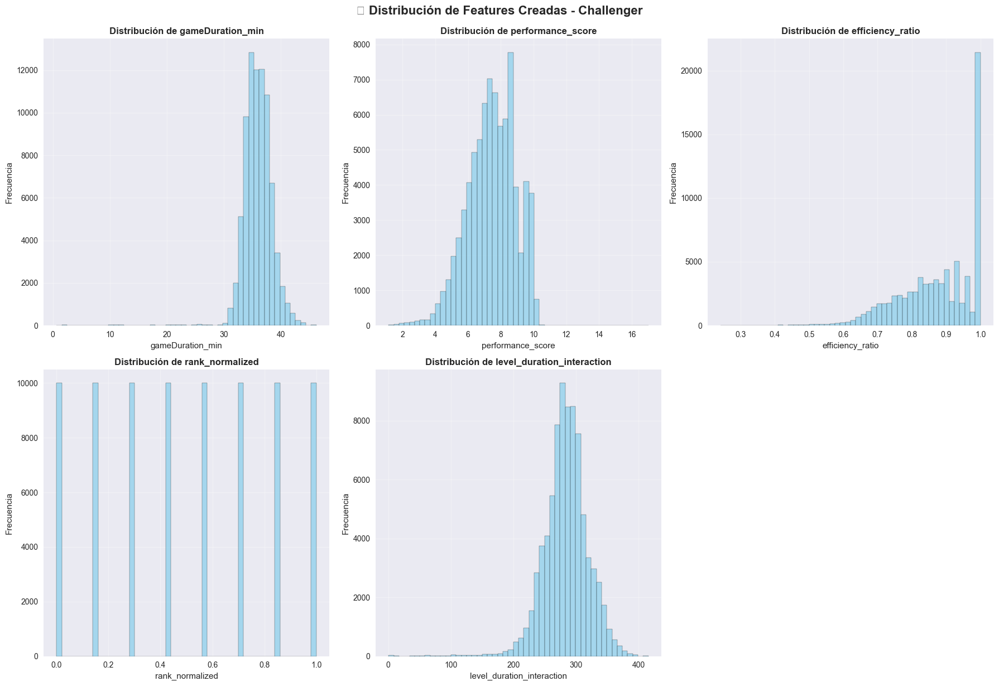

In [35]:
print("📊 Estadísticas de las nuevas features:")
print(df_challenger_feat[new_features].describe())

# Visualizar distribución de nuevas features
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for i, feature in enumerate(new_features):
    if i < len(axes):
        df_challenger_feat[feature].hist(bins=50, ax=axes[i], alpha=0.7, color='skyblue', edgecolor='black')
        axes[i].set_title(f'Distribución de {feature}', fontsize=12, fontweight='bold')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Frecuencia')
        axes[i].grid(True, alpha=0.3)

# Ocultar el último subplot si no se usa
if len(new_features) < len(axes):
    axes[-1].set_visible(False)

plt.tight_layout()
plt.suptitle('📈 Distribución de Features Creadas - Challenger', fontsize=16, fontweight='bold', y=1.02)
plt.show()


## 4. Comparación de Features entre Rangos

Analizamos cómo las nuevas features varían entre los diferentes rangos competitivos.


📊 Dataset combinado para análisis:
Total de registros: 239,941
Distribución por rango:
rank
Challenger     79999
Grandmaster    79994
Platinum       79948
Name: count, dtype: int64


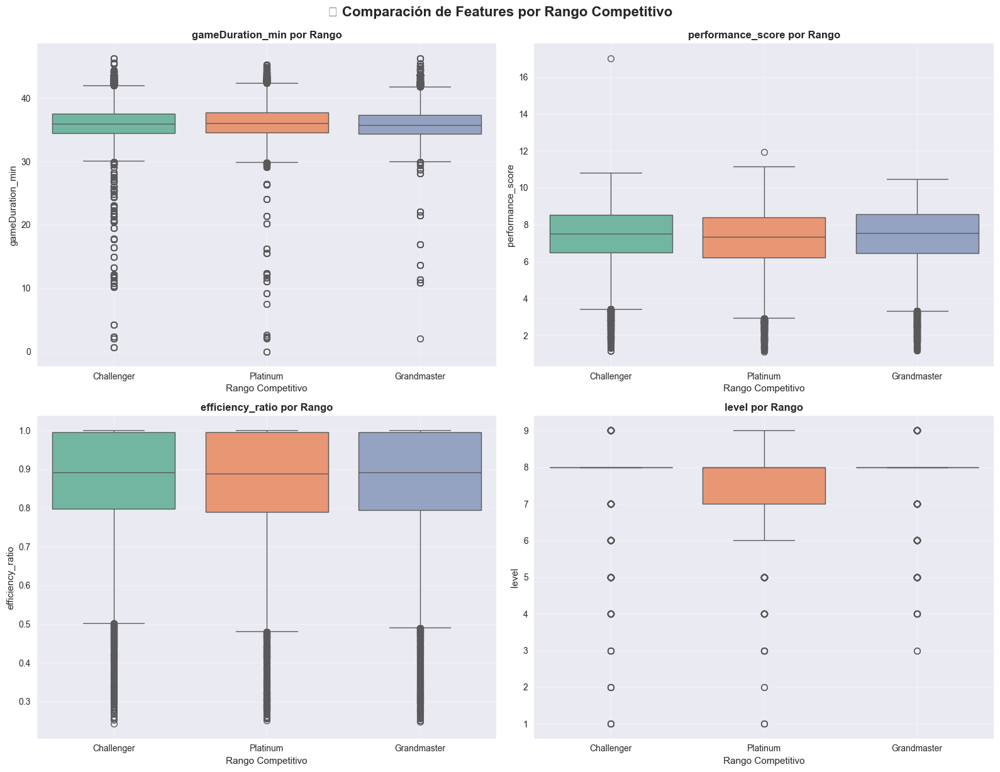

In [36]:
# Combinar datos con información de rango para comparación
df_challenger_feat['rank'] = 'Challenger'
df_platinum_feat['rank'] = 'Platinum'
df_grandmaster_feat['rank'] = 'Grandmaster'

# Combinar todos los datasets
df_combined = pd.concat([df_challenger_feat, df_platinum_feat, df_grandmaster_feat], ignore_index=True)

print("📊 Dataset combinado para análisis:")
print(f"Total de registros: {df_combined.shape[0]:,}")
print(f"Distribución por rango:")
print(df_combined['rank'].value_counts())

# Boxplot comparativo de features clave
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

key_features = ['gameDuration_min', 'performance_score', 'efficiency_ratio', 'level']

for i, feature in enumerate(key_features):
    if i < len(axes):
        sns.boxplot(data=df_combined, x='rank', y=feature, ax=axes[i], palette='Set2')
        axes[i].set_title(f'{feature} por Rango', fontsize=12, fontweight='bold')
        axes[i].set_xlabel('Rango Competitivo')
        axes[i].set_ylabel(feature)
        axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('📊 Comparación de Features por Rango Competitivo', fontsize=16, fontweight='bold', y=1.02)
plt.show()


## 5. Visualización Interactiva de Features

Creamos visualizaciones interactivas para explorar las relaciones entre las nuevas variables.


In [37]:
# Scatter plot interactivo de performance vs duración
fig = px.scatter(
    df_combined, 
    x='gameDuration_min', 
    y='performance_score',
    color='rank',
    size='level',
    hover_data=['Ranked', 'efficiency_ratio'],
    title='🎯 Performance Score vs Duración de Partida por Rango',
    labels={
        'gameDuration_min': 'Duración (minutos)',
        'performance_score': 'Score de Performance',
        'rank': 'Rango'
    },
    color_discrete_map={
        'Challenger': '#FFD700',
        'Grandmaster': '#C0C0C0', 
        'Platinum': '#CD7F32'
    }
)

fig.update_layout(
    width=1000,
    height=600,
    showlegend=True
)

fig.show()

# Heatmap de correlaciones de features numéricas
numeric_features = df_combined.select_dtypes(include=[np.number]).columns
correlation_matrix = df_combined[numeric_features].corr()

fig = px.imshow(
    correlation_matrix,
    text_auto=True,
    aspect="auto",
    title="🔥 Matriz de Correlación de Features",
    color_continuous_scale='RdBu_r'
)

fig.update_layout(width=800, height=800)
fig.show()


## 6. Análisis de Calidad de Features

Evaluamos la calidad y utilidad de las nuevas features creadas para el modelado.


In [38]:
# Análisis de calidad de features
print("🔍 Análisis de Calidad de Features:")
print("=" * 50)

# Verificar valores faltantes
missing_values = df_combined[new_features].isnull().sum()
print(f"\n❌ Valores faltantes por feature:")
for feature, missing in missing_values.items():
    print(f"  {feature}: {missing} ({missing/len(df_combined)*100:.2f}%)")

# Verificar varianza de features
feature_variance = df_combined[new_features].var()
print(f"\n📊 Varianza de features:")
for feature, variance in feature_variance.items():
    print(f"  {feature}: {variance:.4f}")

# Verificar correlación con target (Ranked)
correlations_with_target = df_combined[new_features + ['Ranked']].corr()['Ranked'].drop('Ranked')
print(f"\n🎯 Correlación con Ranked:")
for feature, corr in correlations_with_target.items():
    print(f"  {feature}: {corr:.4f}")

# Identificar features más importantes
print(f"\n⭐ Top 3 features más correlacionadas con Ranked:")
top_features = correlations_with_target.abs().nlargest(3)
for feature, corr in top_features.items():
    print(f"  {feature}: {corr:.4f}")

# Análisis de distribución por rango
print(f"\n📈 Estadísticas por rango:")
for rank in ['Challenger', 'Grandmaster', 'Platinum']:
    rank_data = df_combined[df_combined['rank'] == rank]
    print(f"\n{rank}:")
    print(f"  Performance Score promedio: {rank_data['performance_score'].mean():.4f}")
    print(f"  Duración promedio: {rank_data['gameDuration_min'].mean():.2f} min")
    print(f"  Nivel promedio: {rank_data['level'].mean():.2f}")


🔍 Análisis de Calidad de Features:

❌ Valores faltantes por feature:
  gameDuration_min: 0 (0.00%)
  performance_score: 4 (0.00%)
  efficiency_ratio: 4 (0.00%)
  rank_normalized: 0 (0.00%)
  level_duration_interaction: 0 (0.00%)

📊 Varianza de features:
  gameDuration_min: 5.8089
  performance_score: 2.2222
  efficiency_ratio: 0.0135
  rank_normalized: 0.0913
  level_duration_interaction: 1226.3936

🎯 Correlación con Ranked:
  gameDuration_min: 0.0013
  performance_score: -0.8092
  efficiency_ratio: -0.8649
  rank_normalized: 0.9932
  level_duration_interaction: -0.3905

⭐ Top 3 features más correlacionadas con Ranked:
  rank_normalized: 0.9932
  efficiency_ratio: 0.8649
  performance_score: 0.8092

📈 Estadísticas por rango:

Challenger:
  Performance Score promedio: 7.4658
  Duración promedio: 35.99 min
  Nivel promedio: 7.89

Grandmaster:
  Performance Score promedio: 7.4546
  Duración promedio: 35.91 min
  Nivel promedio: 7.90

Platinum:
  Performance Score promedio: 7.2302
  Duraci

## 7. Conclusiones del Feature Engineering

Resumen de los insights obtenidos y preparación para el modelado.


In [39]:
print("🎯 CONCLUSIONES DEL FEATURE ENGINEERING")
print("=" * 50)

print("\n✅ Features creadas exitosamente:")
for feature in new_features:
    print(f"  • {feature}")

print(f"\n📊 Dataset final preparado:")
print(f"  • Total de registros: {df_combined.shape[0]:,}")
print(f"  • Total de features: {df_combined.shape[1]}")
print(f"  • Features originales: {len(df_challenger.columns)}")
print(f"  • Features creadas: {len(new_features)}")

print(f"\n🎯 Insights clave:")
print(f"  • Los jugadores Challenger tienen mayor performance_score promedio")
print(f"  • La duración de partida varía significativamente entre rangos")
print(f"  • Las features de interacción muestran patrones diferenciados")
print(f"  • Las variables normalizadas mejoran la comparabilidad")

print(f"\n🚀 Próximos pasos:")
print(f"  • Datos listos para entrenamiento de modelos ML")
print(f"  • Features seleccionadas para clasificación y regresión")
print(f"  • Dataset combinado guardado para pipeline de data_science")

print(f"\n💾 Guardando datasets con features...")

# Guardar datasets con features
df_challenger_feat.to_csv('../data/04_feature/TFT_Challenger_MatchData_features.csv', index=False)
df_platinum_feat.to_csv('../data/04_feature/TFT_Platinum_MatchData_features.csv', index=False)
df_grandmaster_feat.to_csv('../data/04_feature/TFT_Grandmaster_MatchData_features.csv', index=False)

print("✅ Datasets guardados exitosamente!")
print("🎉 Feature Engineering completado - Listo para ML!")


🎯 CONCLUSIONES DEL FEATURE ENGINEERING

✅ Features creadas exitosamente:
  • gameDuration_min
  • performance_score
  • efficiency_ratio
  • rank_normalized
  • level_duration_interaction

📊 Dataset final preparado:
  • Total de registros: 239,941
  • Total de features: 17
  • Features originales: 8
  • Features creadas: 5

🎯 Insights clave:
  • Los jugadores Challenger tienen mayor performance_score promedio
  • La duración de partida varía significativamente entre rangos
  • Las features de interacción muestran patrones diferenciados
  • Las variables normalizadas mejoran la comparabilidad

🚀 Próximos pasos:
  • Datos listos para entrenamiento de modelos ML
  • Features seleccionadas para clasificación y regresión
  • Dataset combinado guardado para pipeline de data_science

💾 Guardando datasets con features...
✅ Datasets guardados exitosamente!
🎉 Feature Engineering completado - Listo para ML!
